# Calibrated Chaos

Здесь повторены некоторые эксперименты из статьи [Calibrated Chaos: Variance Between Runs of Neural Network Training is Harmless and Inevitable](https://arxiv.org/abs/2304.01910) на других датасетах и моделях. Были использованы две пары датасет-модель:

1. ImageNet, ResNet50
2. [TabR](https://github.com/yandex-research/tabular-dl-tabr)([статья](https://arxiv.org/abs/2307.14338)), [california housing](https://scikit-learn.org/stable/modules/generated/sklearn.datasets.fetch_california_housing.html)

   Было рассмотрено влияние порядка данных при обучении и инициализирующего сида (как по отдельности так и вместе) на стандартное отклонение функции потерь на тестовой и валидационной выборках. Также рассмотрена корреляция фрагментов данных на обученной до сходимости модели. Была проиллюстрирована зависимоть предсказывающей способности модели от класса к классу в задаче классификации изображений.

### Чтобы воспроизвести mlp эксперименты, необходимо:

1. Склонировать репозиторий: https://github.com/Di0rdan/tabular-dl-tabr.git

   Этот репозиторий является форком [открытого репозитория yandex-research]( https://github.com/yandex-research/tabular-dl-tabr), с некоторым дополнительным функцоиналом.

2. Установить окружение по инструкции из [README.md](https://github.com/yandex-research/tabular-dl-tabr/blob/main/README.md)

3. Обучить модели:

```bash
cp exp/mlp/california/0-tuning.toml exp/mlp/california/0-reproduce2-tuning.toml
python bin/tune.py exp/mlp/california/0-reproduce2-tuning.toml

python bin/evaluate.py exp/mlp/california/0-reproduce2-tuning --n_seeds 50
python bin/evaluate.py exp/mlp/california/0-reproduce2-tuning --n_seeds 50 --change_data_seed 1
python bin/evaluate.py exp/mlp/california/0-reproduce2-tuning --n_seeds 50 --change_data_seed 1 --change_eval_seed 0

python bin/evaluate.py exp/mlp/california/0-reproduce2-tuning --n_seeds 50 --n_epochs 20
python bin/evaluate.py exp/mlp/california/0-reproduce2-tuning --n_seeds 50 --change_data_seed 1 --n_epochs 20
python bin/evaluate.py exp/mlp/california/0-reproduce2-tuning --n_seeds 50 --change_data_seed 1 --change_eval_seed 0 --n_epochs 20
```

### Чтобы воспроизвести эксперименты с классификацией изображений, необходимо:

1. Скачать датасет [ImageNet](https://image-net.org) и сложить его в директорию `data` рядом с ноутбуком.

2. [Скачать веса](https://yadi.sk/d/rdk6ylF5mK8ptw?w=1) для ResNet50 и сложить их в директорию `deepens_imagenet` рядом с ноутбуком.

    Эти веса взяты из [открытого репозитория](https://github.com/SamsungLabs/pytorch-ensembles) к статье [Pitfalls of In-Domain Uncertainty Estimation and Ensembling in Deep Learning](https://arxiv.org/abs/2002.06470)

In [ ]:
import numpy as np
import json
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import numpy as np
from tqdm.notebook import tqdm

from torchvision.models import resnet50
import torch

from torchvision.datasets import ImageNet
import torchvision.transforms as transforms

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [17]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

In [106]:
batch_size=32
num_workers=1

loader = torch.utils.data.DataLoader(
    ImageNet(
        root='data', 
        split='val', 
        transform=transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                                 std=[0.229, 0.224, 0.225]),
    ])),
    batch_size=batch_size, shuffle=False,
    num_workers=num_workers, 
#     pin_memory=True
)

def one_sample_pred(loader, model, **kwargs):
    preds = []
    model.eval()

    for i, (input, target) in tqdm(enumerate(loader)):
        input = input.to(device)
        with torch.no_grad():
            output = model(input, **kwargs)
        log_probs = torch.nn.functional.log_softmax(output, dim=1)
        preds.append(log_probs.cpu().data.numpy())

    return np.vstack(preds)

In [ ]:
import os

weight_storage = 'deepens_imagenet'
weight_paths = list(filter(lambda file_name: file_name.endswith('.pth.tar'), os.listdir(weight_storage)))

targets = []
for i, (input, target) in tqdm(enumerate(loader)):
    targets.append(target)
    
targets = np.hstack(targets)
targets.tofile('targets')

for weight_path in weight_paths:
    print(f"model at: {weight_path}")
    dct = torch.load(os.path.join(weight_storage, weight_path))
    state_dict = {
        key[7:]: value
        for key, value in dct['state_dict'].items()
    }
    
    model = resnet50()
    model.load_state_dict(state_dict)
    model.eval()
    
    model.to(device)
    
    preds = one_sample_pred(loader, model).astype(np.float64)
    preds.tofile(f'pred_of_{weight_path.split("/")[-1]}_.dat')
#     print(preds)

In [3]:
def get_scores(path):
    res = []
    name = path.split('/')[-1]
    for run_dir in os.listdir(path):
        file_name = os.path.join(path, run_dir, 'summary.json')
        if not os.path.exists(file_name):
            continue
        with open(file_name, 'r') as file:
            data = file.read()
        scores = json.loads(data)['scores']
        res.append([scores['train'], scores['val'], scores['test']])

    # return pd.DataFrame(res, columns=[f'{name}_train', f'{name}_val', f'{name}_test'], dtype=float)
    return pd.DataFrame(res, columns=[f'train', f'val', f'test'], dtype=float)

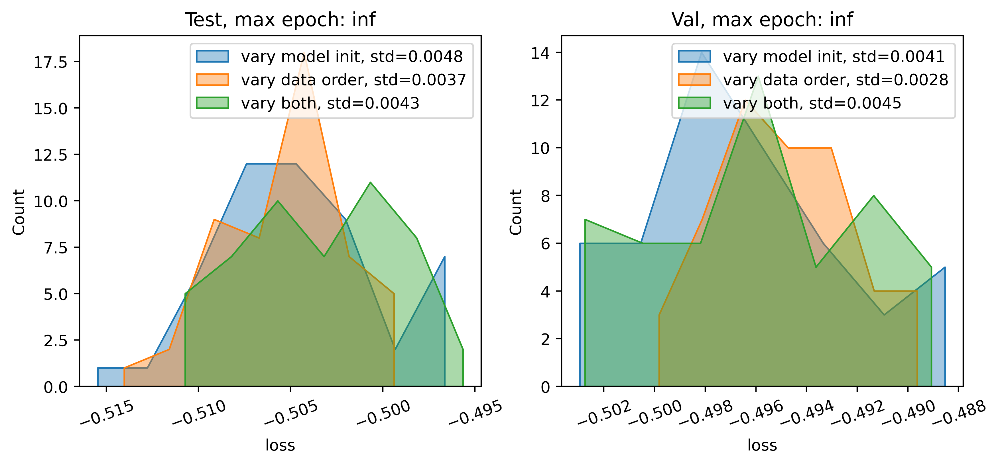

In [222]:
dirs = {
    'vary model init': 'tabular-dl-tabr/exp/mlp/california/0-reproduce2-evaluation',
    'vary data order': 'tabular-dl-tabr/exp/mlp/california/0-reproduce2-evaluation_seed_on_data',
    'vary both': 'tabular-dl-tabr/exp/mlp/california/0-reproduce2-evaluation_seed_on_eval_data', 
}

plt.figure(dpi=400, figsize=(10, 4))

def make_hist(dirs, split):
    for label, directory in dirs.items():
        data = get_scores(directory)[split]
        std = round(data.std(), 4)
        sns.histplot(x=data, element="poly", label=f'{label}, std={std}', alpha=0.4)
    plt.legend()
    plt.xlabel(f'loss')
    plt.xticks(rotation=20)

plt.subplot(1, 2, 1)
plt.title('Test, max epoch: inf')
make_hist(dirs, 'test')

plt.subplot(1, 2, 2)
plt.title('Val, max epoch: inf')
make_hist(dirs, 'val')

plt.show()

Здесь построены распределения ошибок одной модели, обученной несколько раз с тремя видами случайности:

1. Случайная инициализация весов модели.
2. Случайный порядок данных при обучении модели.
3. Оба пункта сразу.

Как видим, разброс в качестве модели меньше зависит от порядка данных, чем от начальной инициализации, что не совпадает с наблюдениями авторов статьи. При этом разброс, при обучении с двумя типами случайности, мало отличается от разброса только с первым типом. Это наблюдение совпадает с наблюдениями авторов.

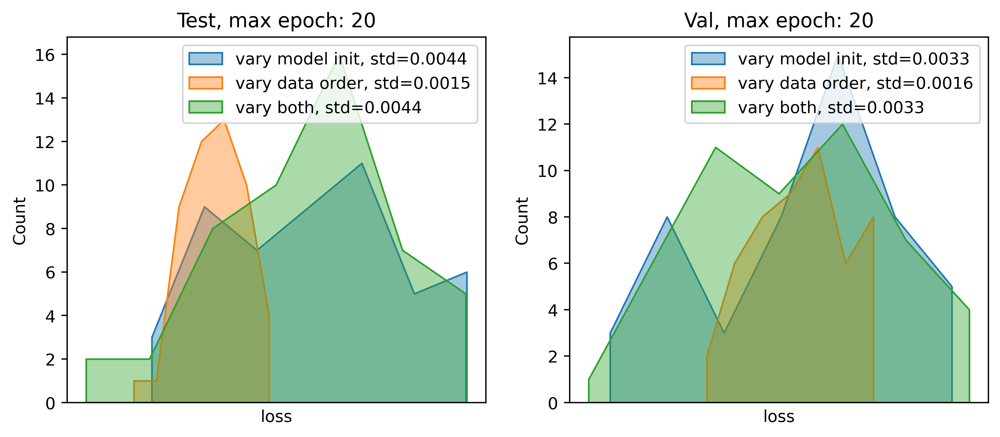

In [230]:
dirs = {
    'vary model init': 'tabular-dl-tabr/exp/mlp/california/0-reproduce2-evaluation_epochs_20.0',
    'vary data order': 'tabular-dl-tabr/exp/mlp/california/0-reproduce2-evaluation_seed_on_data_epochs_20.0',
    'vary both': 'tabular-dl-tabr/exp/mlp/california/0-reproduce2-evaluation_seed_on_eval_data_epochs_20.0', 
}

plt.figure(dpi=400, figsize=(10, 4))

def make_hist(dirs, split):
    for label, directory in dirs.items():
        data = get_scores(directory)[split]
        std = round(data.std(), 4)
        sns.histplot(x=data, element="poly", label=f'{label}, std={std}', alpha=0.4)
    plt.legend()
    plt.xlabel(f'loss')
    plt.xticks(
        [], 
               rotation=20
    )

plt.subplot(1, 2, 1)
plt.title('Test, max epoch: 20')
make_hist(dirs, 'test')

plt.subplot(1, 2, 2)
plt.title('Val, max epoch: 20')
make_hist(dirs, 'val')

plt.show()

Здесь графики построены аналогично предыдущим, однако модели обучались не до полной сходимости, а лишь первые 20 эпох (полная сходиомть моделей достигается на 100-120 эпохе).

Как видим, случайность первого и второго типа вносят заметно отличающийся разброс, при этом разброс при первом типе случайности по прежнему мало отличается от разброса, полученного при обучении с обоими типами случайности. Поведение отличается от наблюдений авторов.

In [224]:
target = np.fromfile('targets', dtype=np.int64)

dct = {}

np.random.seed(3)
shuffle = np.arange(target.shape[0])
np.random.shuffle(shuffle)

for file_name in os.listdir():
    if not file_name.startswith('pred_of_ImageNet-ResNet50'):
        continue
    preds = np.fromfile(file_name, dtype=np.float64).reshape(-1, 1000)
    preds = np.argmax(preds, axis=1)
    # print(shuffle)
    
    splitter = target.shape[0] // 2
    dct[file_name] = {
        'preds': preds,
        'accuracy': (preds == target).mean(),
        'accuracy1': (preds[shuffle[:splitter]] == target[shuffle[:splitter]]).mean(),
        'accuracy2': (preds[shuffle[splitter:]] == target[shuffle[splitter:]]).mean(),
    }

In [225]:
acc1 = np.array([tmp['accuracy1'] for tmp in dct.values()])
acc2 = np.array([tmp['accuracy2'] for tmp in dct.values()])

In [226]:
acc_pairs = []

for i in range(100):
    shuffle = np.arange(target.shape[0])
    np.random.shuffle(shuffle)
    
    splitter = target.shape[0] // 2

    for name, value in dct.items():
        preds = value['preds']
        accuracy1 = (preds[shuffle[:splitter]] == target[shuffle[:splitter]]).mean()
        accuracy2 = (preds[shuffle[splitter:]] == target[shuffle[splitter:]]).mean()

        acc_pairs.append((accuracy1, accuracy2))
acc_pairs = np.array(acc_pairs)

In [227]:
corrs = []
for i in range(100):
    sample = acc_pairs[i*50:i*50+50]
    corr = np.corrcoef(sample[:, 0], sample[:, 1])[1, 0]
    corrs.append(corr)
corrs = np.array(corrs)

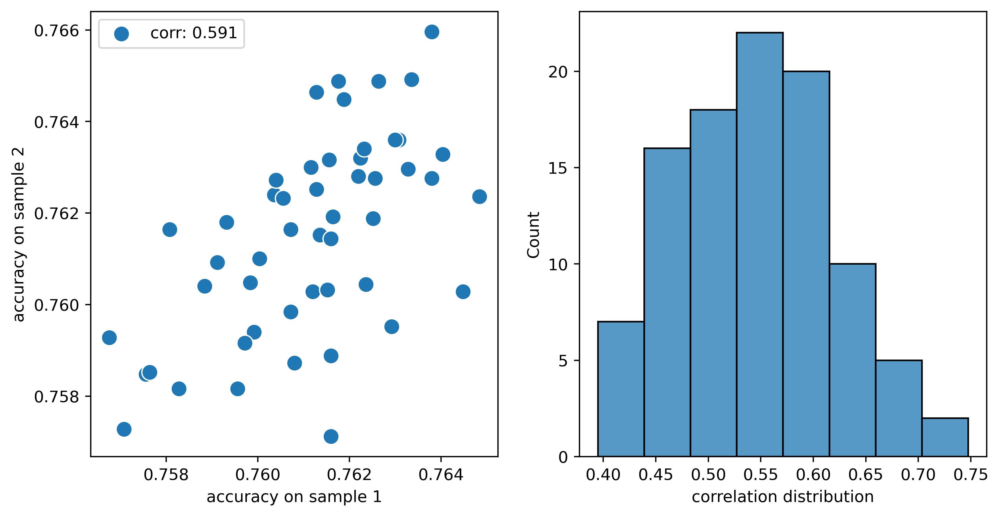

In [228]:
plt.figure(dpi=400, figsize=(10, 5))

# plt.title('')
plt.subplot(1, 2, 1)
sns.scatterplot(x=acc1, y=acc2, 
                label=f'corr: {round(np.corrcoef(acc1, acc2)[1, 0], 3)}', 
                s=100)
plt.xlabel('accuracy on sample 1')
plt.ylabel('accuracy on sample 2')
plt.legend()

# plt.subplot(1, 2, 2)
# sampled_acc1 = acc_pairs[:, 0]
# sampled_acc2 = acc_pairs[:, 1]
# sns.scatterplot(x=sampled_acc1, y=sampled_acc2, 
#                 label=f'corr: {round(np.corrcoef(sampled_acc1, sampled_acc2)[1, 0], 3)}', 
#                 s=10)
# plt.legend()

plt.subplot(1, 2, 2)
sns.histplot(corrs
             # , element="poly"
            )
plt.xlabel('correlation distribution')
# plt.legend()

plt.show()

График справа: здесь тестирующая выборка ImageNet была разбита на две подвыборки равного размера. 50 моделей ResNet50, отличающиейся лишь случайностью во время обучения, были протестированы на каждой из выборок по отдельности. Авторы статьи заявляют о декоррелированности полученных метрик, однако наш тест говорит об обратном. На случайном тесте корреляций оказалась выше 0.5. Если принять во внимание эксперимент авторов с Бертом, где с увеличением числа весов в модели корреляция повышается, то это наблюдение мы можем подтвердить.

График слева: здесь тестирующая выборка разбивалась на две равный подвыборки случайным образом 100 раз, и для каждого из разбиений была получена корреляция. Распределение этих корреляций можно видеть на графике. Как видим, корреляция стабильно далека от нулевой.

In [80]:
mat = []
for name, info in dct.items():
    mat.append((info['preds'] == target).astype(float))
mat = np.array(mat)

In [81]:
# mat = mat / np.sqrt(np.sum(mat**2, axis=0))

In [94]:
vecs = np.swapaxes(mat, 0, 1).reshape(-1, 1000)
vecs = vecs / np.sqrt(np.sum(vecs**2, axis=0))

In [95]:
corrs = vecs.T @ vecs

In [103]:
sim_classes = (corrs - np.eye(corrs.shape[0])).argmax(axis=0)

In [211]:
dset = ImageNet(root='data', split='val')

def show_classes_examples(cls, num=5):
    for i in range(num):
        plt.subplot(1, num, i+1)
        plt.imshow(dset[50*cls + i][0])
        plt.axis('off')

def show_sim(cls):
    # print(f'class: {cls}')
    plt.figure(dpi=400)
    show_classes_examples(cls)
    plt.show()

    # print(f'most similar class {}')
    plt.figure(dpi=400)
    show_classes_examples(sim_classes[cls])
    plt.show()

Авторы опираются на независимость сэмплов в распределении, откуда выводят некоторые оценки на отклонение предсказывающей способности модели. Авторы вместе с тем признают, что говорить о независимости реальных данных сложно и приводят несколько примеров пар изображений, на которых модели ведут себя похожим образом. Все эти пары относятся к одному классу. Мы же решили проверить сходство самих классов в данных.

Далее будут приведены несколько пар классов, они подбирались по следующему принципу:

1. Для каждого класса строятся предсказания всех моделей по всем сэмплам данного класса.
2. Для каждого класса вычисляется матрица булевых переменных, каждая из которых означает угадала ли конкретная модель, конкретный сэмпл.
3. Для каждого класса находится другой "похожий" класс. Для этого выбирается класс имеющий максимальную корреляцию булевой матрицы с булевой матрицей данного класса.

Далее будут примеры пар "похожих" классов. В первой строчке изображения относящиеся к одному классу, а во втором к другому, максимально похожему на первый.

Как видим, подобный подход выявляет пары "похожих" классов вполне ожидаемо: разные виды насекомых, разные породы собак итд. Это позволяет нам говорить о зависимости не только между сэмплами одного класса, но и между некоторыми классами.

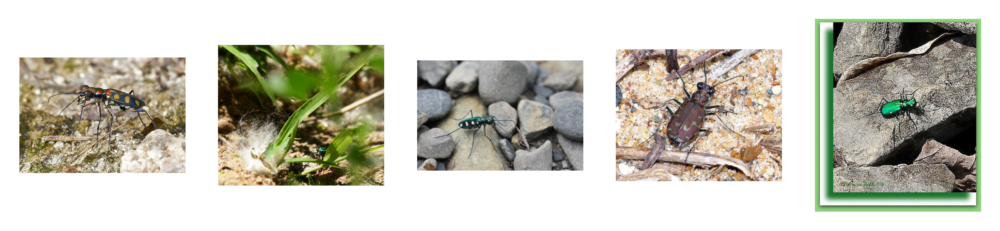

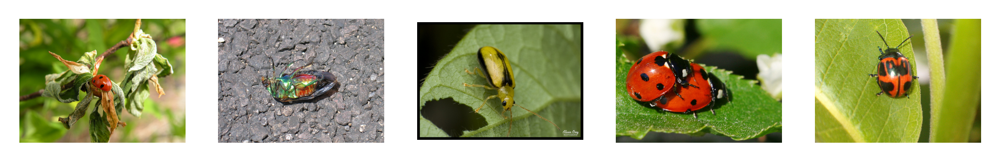

In [229]:
show_sim(300)

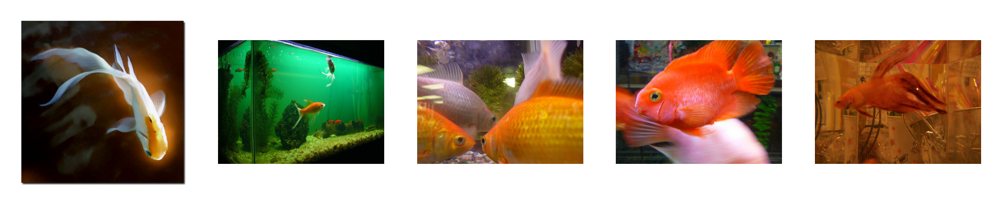

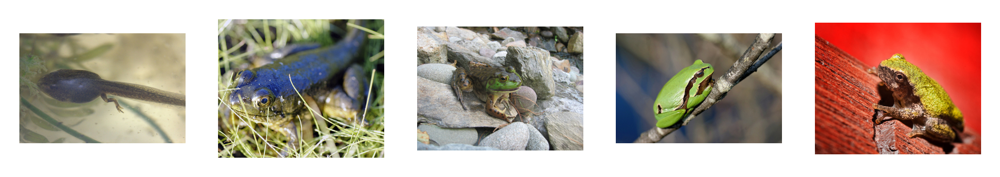

In [146]:
show_sim(1)

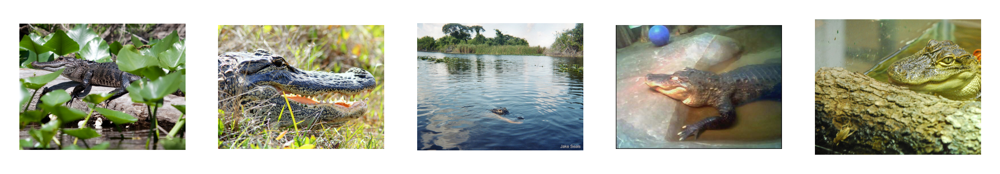

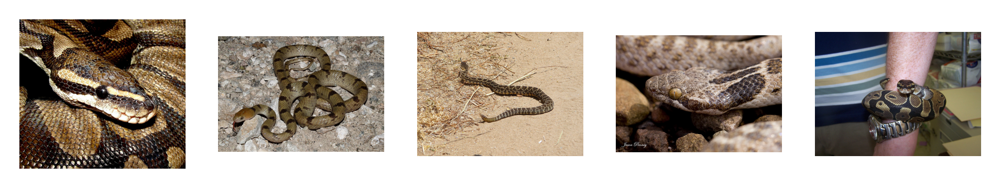

In [147]:
show_sim(50)

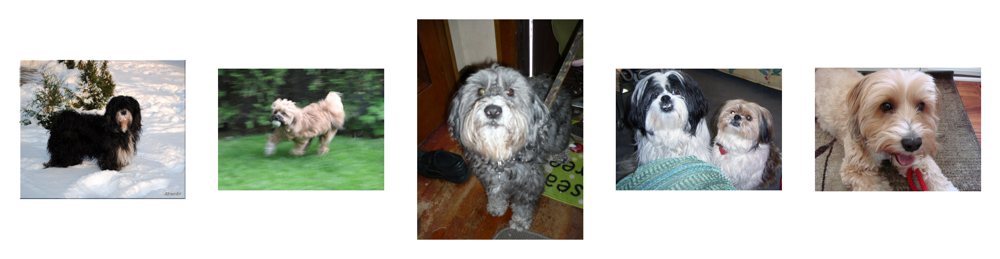

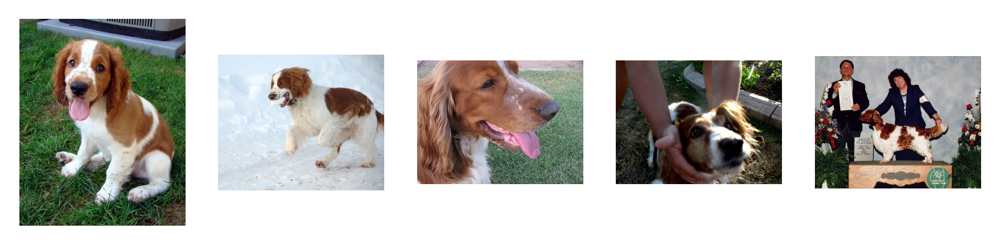

In [149]:
show_sim(200)